In [1]:
import json
import sqlite3
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from torch.nn.parallel import DistributedDataParallel
from PIL import Image
import torchvision.utils as vutils

import os 
import threading
import torch
import torchvision

from torch import nn, optim
from torch.utils.data import DataLoader, Subset, DistributedSampler, TensorDataset
from torchvision import datasets, transforms
from torchvision import models
import time 
#from torch.utils.tensorboard import SummaryWriter

In [2]:
def get_disc(in_channels):
    class Discriminator(nn.Module):
        def __init__(self, in_channels):
            super().__init__()
            self.pooling = nn.MaxPool2d(kernel_size=2, stride=2)
            self.conv1 = self._conv_block(in_channels, in_channels * 16, kernel_size=4, stride=2, padding=1)    
            self.conv2 = self._conv_block(in_channels * 16, in_channels * 32, kernel_size=4, stride=2, padding=1)
            self.conv3 = self._conv_block(in_channels * 32, in_channels * 64, kernel_size=4, stride=2, padding=1)
            self.conv4 = self._conv_block(in_channels * 64, in_channels * 128, kernel_size=4, stride=2, padding=1)
            self.conv5 = self._conv_block(in_channels * 128, in_channels * 256, kernel_size=4, stride=2, padding=1)
            self.conv6 = self._conv_block(in_channels * 256, in_channels * 512, kernel_size=4, stride=2, padding=1)
            self.out_layer = self._conv_block(in_channels * 512, in_channels , kernel_size=4, stride=2, padding=1, activation = False)
        
        def _conv_block(self, in_channels, out_channels, kernel_size, stride, padding, activation = True):
            if activation: 
                return nn.Sequential(
                    nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, bias = False),
                    nn.BatchNorm2d(out_channels,affine=True),
                    nn.LeakyReLU(0.2)
                    )
            else:
                return nn.Sequential(
                nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, bias = False),
            )

        def forward(self, x):
            #print(x.shape)
            x = self.conv1(x)
            #print(x.shape)
            x = self.conv2(x)
            #print(x.shape)
            #x = self.pooling(x)
            #print(x.shape)
            x = self.conv3(x)
            #print(x.shape)
            x = self.conv4(x)
            #print(x.shape) 
            x = self.conv5(x)
            #print(x.shape)
            x = self.conv6(x)
            #print(x.shape)
            x = self.out_layer(x)
            #print(x.shape)
            return x #torch.sigmoid(x)

    return Discriminator(in_channels)

def get_gen(latent_dim, channels, filters):
    class Generator(nn.Module):
        def __init__(self, latent_dim, channels, filters):
            super().__init__()
         
            self.conv1 = self._conv_blockT(in_channels = latent_dim, out_channels = filters * 128, kernel_size = 4,stride = 2, padding = 1)
            self.conv2 = self._conv_blockT(in_channels = filters * 128, out_channels = filters * 64, kernel_size = 4,stride = 2, padding = 1) 
            self.conv3 = self._conv_blockT(in_channels = filters * 64, out_channels = filters * 32, kernel_size = 4,stride = 2, padding = 1) 
            self.conv4 = self._conv_blockT(in_channels = filters * 32, out_channels = filters * 16,kernel_size = 4,stride = 2,padding = 1)
            self.conv5 = self._conv_blockT(in_channels = filters * 16, out_channels = filters * 8,kernel_size = 4,stride = 2,padding = 1)
            self.conv6 = self._conv_blockT(in_channels = filters * 8, out_channels = filters * 4,kernel_size = 4,stride = 2,padding = 1)
                                
            self.out_layer = nn.Sequential(
                nn.ConvTranspose2d(in_channels = filters * 4, out_channels = channels, kernel_size = 4, stride = 2, padding = 1)
                )


        def _conv_blockT(self, in_channels, out_channels, kernel_size, stride, padding):
            return nn.Sequential(
                nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias = False),
                nn.BatchNorm2d(out_channels), 
                nn.ReLU()
            )

        def forward(self, x):
            x = self.conv1(x)
            #print(x.shape)
            x = self.conv2(x)
            #print(x.shape)
            x = self.conv3(x)
            #print(x.shape)
            x = self.conv4(x)
            #print(x.shape)
            x = self.conv5(x)
            #print(x.shape)
            x = self.conv6(x)
            #print(x.shape)
            x = self.out_layer(x)
            #print(x.shape)
            #x = nn.functional.interpolate(x, size=(128, 128), mode='bilinear', align_corners=False)
            #print(x.shape)
            return torch.tanh(x)

    return Generator(latent_dim, channels, filters) 

x = torch.randn(1,3,128,128)
d = get_disc(3)
assert d(x).shape == torch.randn(1,3,1,1).shape, "Incorrect Discriminator Shape!"
g = get_gen(125,3,64)
z = torch.randn(1,125,1,1)
assert g(z).shape == x.shape, "Incorrect Generator Shape!"

In [3]:
import os
from PIL import Image
import torch
from torchvision import transforms
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

means = torch.tensor([0.5, 0.5, 0.5]).to(device)
stds = torch.tensor([0.5, 0.5, 0.5]).to(device)

class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform

        self.image_paths = os.listdir(root_dir)

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = os.path.join(self.root_dir, self.image_paths[idx])
        image = Image.open(image_path).convert("RGB")

        if self.transform:
            image = self.transform(image)
        return image

path = '/home/jovyan/updated_levels_2'

transform = transforms.Compose([
transforms.Resize((128, 128)),
transforms.ToTensor(),       
transforms.Normalize(means,stds),
    ]
)

transform_aug = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),       
    transforms.Normalize(means, stds), 
    #transforms.RandomAffine(degrees=(30, 180), translate=(0.2, 0.2), scale=(0.5, 1.1)),
    transforms.RandomHorizontalFlip(0.55), 
    transforms.RandomVerticalFlip(0.55),
    #transforms.GaussianBlur(kernel_size=(3, 3), sigma=(0.1, 5)), 
    #transforms.RandomAdjustSharpness(sharpness_factor=2),
    #transforms.RandomAutocontrast(p=0.333)
])

dataset = CustomDataset(root_dir=path, transform=transform)
dataset_aug = CustomDataset(root_dir=path, transform=transform_aug)

def get_data_loaders(dataset, batch_size):
    train_loader = DataLoader(
        dataset,
        batch_size=batch_size,
        shuffle=True,
        drop_last=True
    )

    img = next(iter(train_loader))
    print(f"Shape of the image: {img.shape}")
    img_dim = img.shape[2] * img.shape[3] 
    channels = img.shape[1]
    print(len(train_loader))
    return channels, img, img_dim, train_loader


In [6]:
from torch.utils.data import DataLoader, ConcatDataset
latent_dim = 128
filters = 32
batch_size = 32
lr = 2e-5
epochs = 1900


channels, img, img_dim, train_loader = get_data_loaders(dataset, batch_size)
#_,_,_,train_loader_aug = get_data_loaders(dataset_aug,batch_size)
gen = get_gen(latent_dim, channels, filters).to(device)
gen.load_state_dict(torch.load("/home/jovyan/generator_2.pth"))
disc = get_disc(channels).to(device)
disc.load_state_dict(torch.load("/home/jovyan/discriminator_2.pth"))


#concat_dataset = ConcatDataset([train_loader.dataset, train_loader_aug.dataset])
#concat_loader = DataLoader(concat_dataset, batch_size=32, shuffle=True)



Shape of the image: torch.Size([32, 3, 128, 128])
14


<All keys matched successfully>

/tmp/ipykernel_704658/2428991424.py:42: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  generated = (generated * torch.tensor(stds).view(3, 1, 1)) + torch.tensor(means).view(3, 1, 1).to(device)


At epoch 0, the duration was 13.06 minutes!
Discriminator Loss: -0.6588, Generator loss: 0.3131


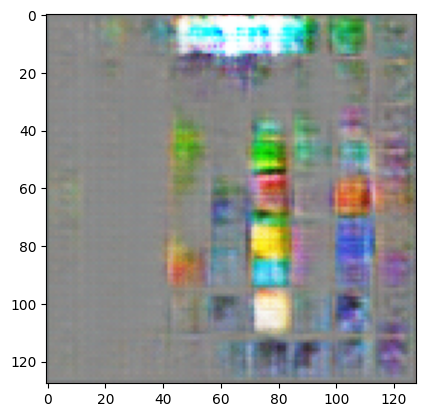

Saved!
At epoch 1, the duration was 13.04 minutes!
Discriminator Loss: -0.6582, Generator loss: 0.3130


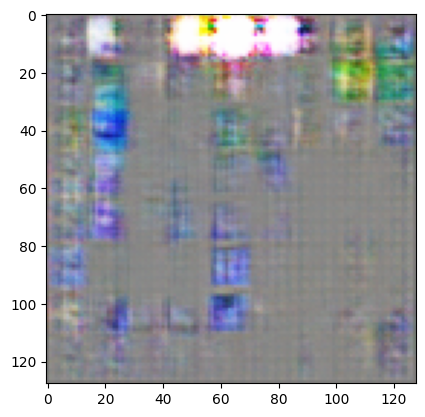

Saved!
At epoch 2, the duration was 13.06 minutes!
Discriminator Loss: -0.6543, Generator loss: 0.3103


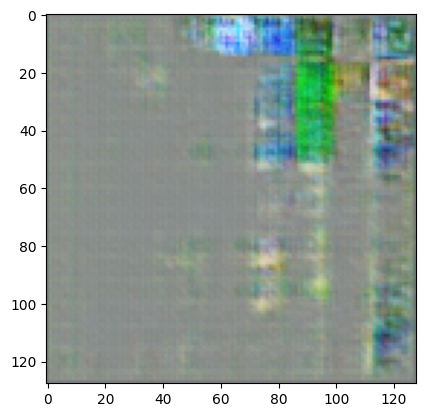

Saved!
At epoch 3, the duration was 13.06 minutes!
Discriminator Loss: -0.6587, Generator loss: 0.3129


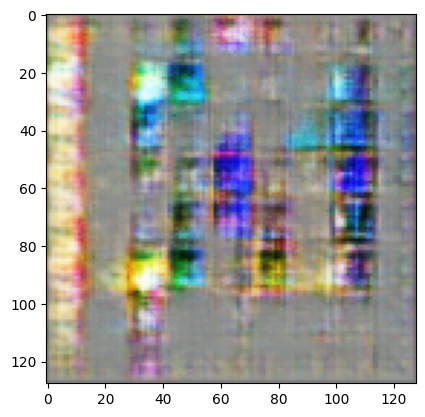

Saved!
At epoch 4, the duration was 13.08 minutes!
Discriminator Loss: -0.6555, Generator loss: 0.3116


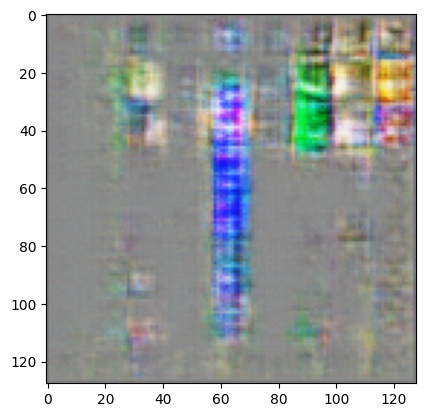

Saved!
At epoch 5, the duration was 13.04 minutes!
Discriminator Loss: -0.6570, Generator loss: 0.3122


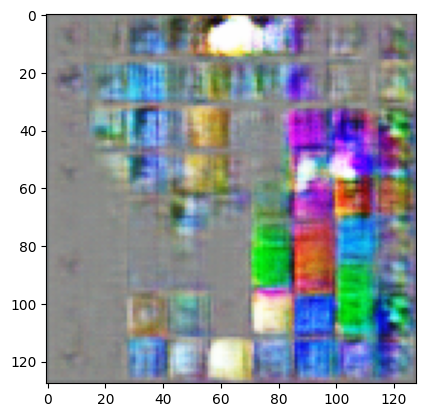

Saved!
At epoch 6, the duration was 13.05 minutes!
Discriminator Loss: -0.6587, Generator loss: 0.3131


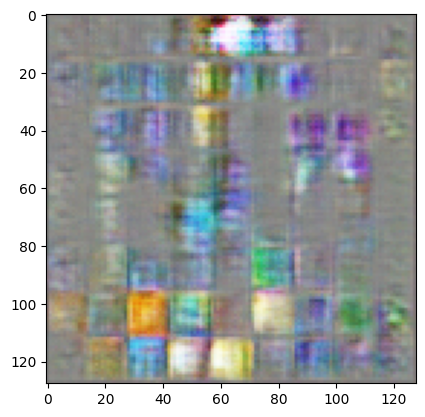

Saved!
At epoch 7, the duration was 13.07 minutes!
Discriminator Loss: -0.6585, Generator loss: 0.3131


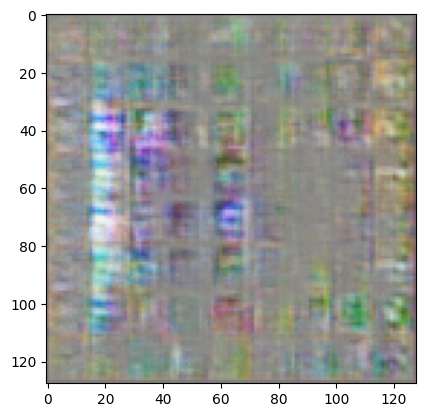

Saved!
At epoch 8, the duration was 13.08 minutes!
Discriminator Loss: -0.6588, Generator loss: 0.3131


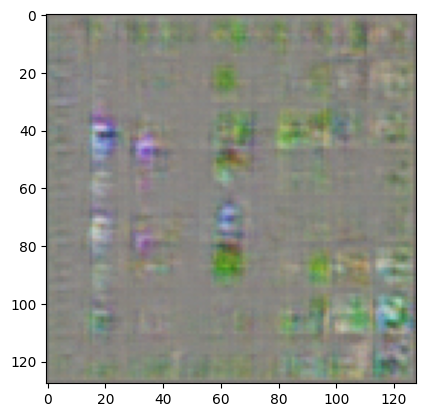

Saved!
At epoch 9, the duration was 13.06 minutes!
Discriminator Loss: -0.6579, Generator loss: 0.3127


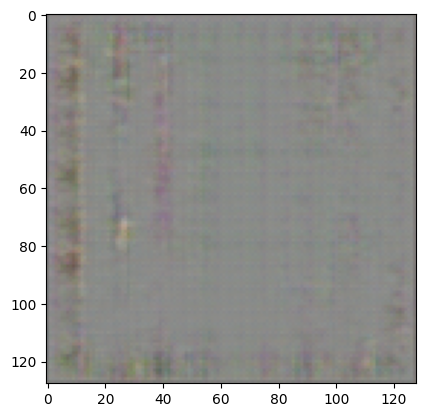

Saved!
At epoch 10, the duration was 13.06 minutes!
Discriminator Loss: -0.6564, Generator loss: 0.3120


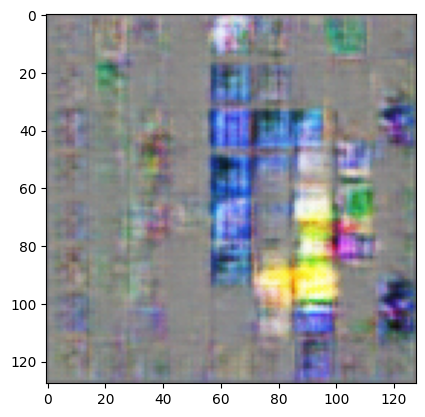

Saved!
At epoch 11, the duration was 13.03 minutes!
Discriminator Loss: -0.6587, Generator loss: 0.3131


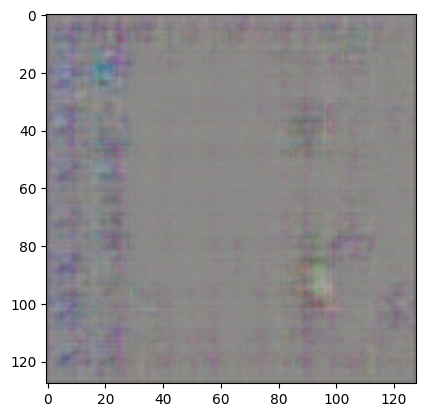

Saved!
At epoch 12, the duration was 13.11 minutes!
Discriminator Loss: -0.6576, Generator loss: 0.3124


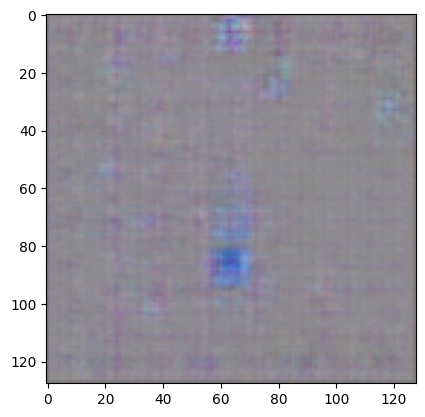

Saved!
At epoch 13, the duration was 13.06 minutes!
Discriminator Loss: -0.6587, Generator loss: 0.3130


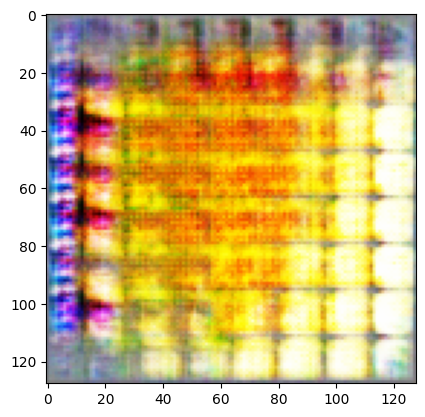

Saved!
At epoch 14, the duration was 13.06 minutes!
Discriminator Loss: -0.6588, Generator loss: 0.3130


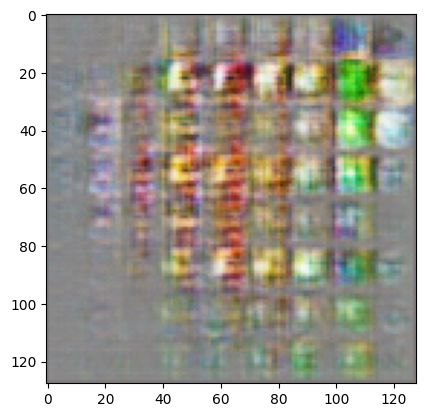

Saved!
At epoch 15, the duration was 13.04 minutes!
Discriminator Loss: -0.6586, Generator loss: 0.3130


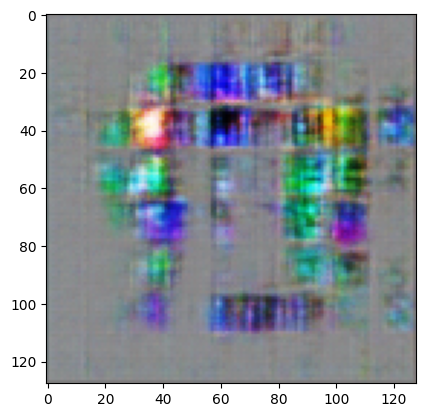

Saved!
At epoch 16, the duration was 13.07 minutes!
Discriminator Loss: -0.6587, Generator loss: 0.3130


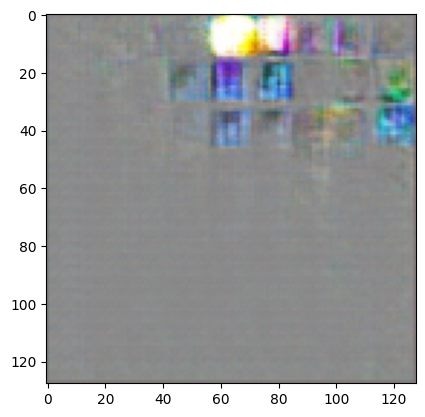

Saved!
At epoch 17, the duration was 13.04 minutes!
Discriminator Loss: -0.6587, Generator loss: 0.3131


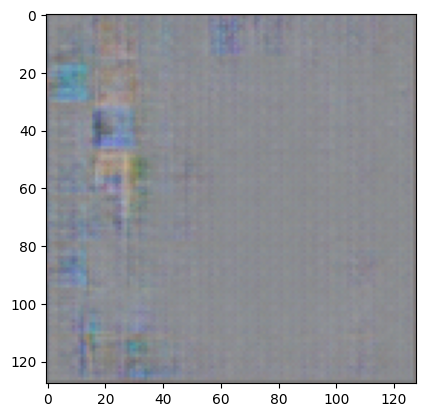

Saved!
At epoch 18, the duration was 13.05 minutes!
Discriminator Loss: -0.6585, Generator loss: 0.3130


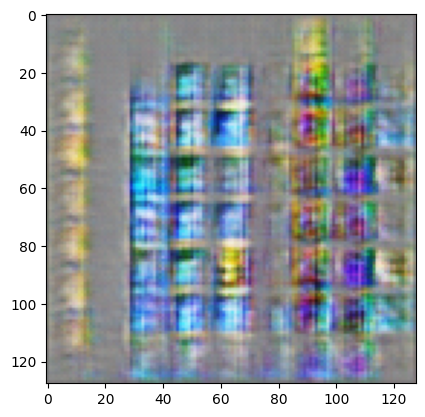

Saved!
At epoch 19, the duration was 13.08 minutes!
Discriminator Loss: -0.6588, Generator loss: 0.3131


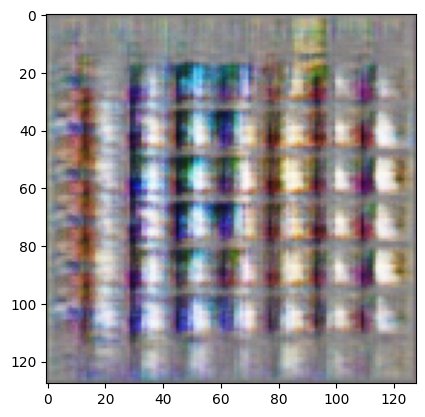

Saved!
At epoch 20, the duration was 13.07 minutes!
Discriminator Loss: -0.6584, Generator loss: 0.3130


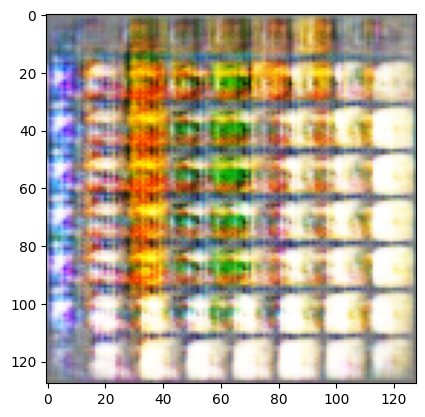

Saved!
At epoch 21, the duration was 13.03 minutes!
Discriminator Loss: -0.6586, Generator loss: 0.3131


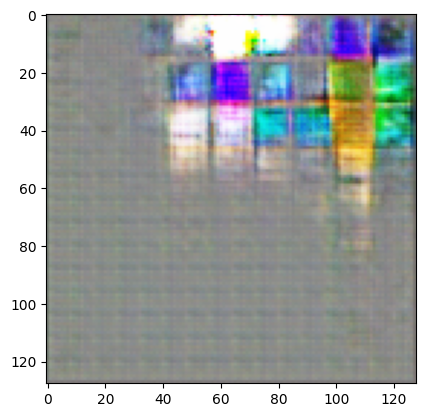

Saved!
At epoch 22, the duration was 13.09 minutes!
Discriminator Loss: -0.6587, Generator loss: 0.3130


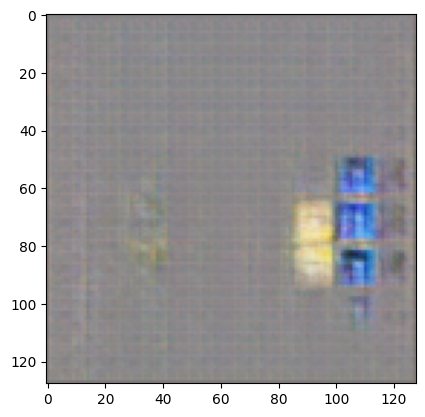

Saved!
At epoch 23, the duration was 13.09 minutes!
Discriminator Loss: -0.6587, Generator loss: 0.3131


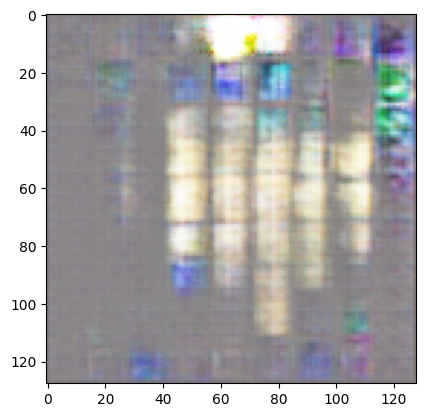

Saved!
At epoch 24, the duration was 13.08 minutes!
Discriminator Loss: -0.6585, Generator loss: 0.3129


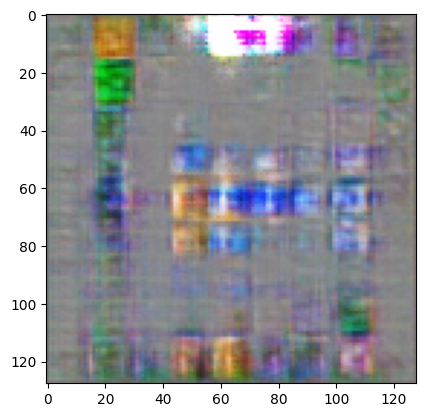

Saved!
At epoch 25, the duration was 13.08 minutes!
Discriminator Loss: -0.6587, Generator loss: 0.3130


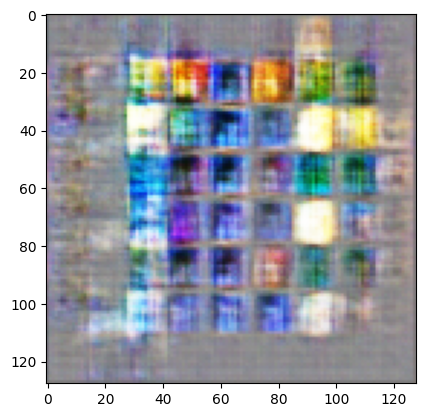

Saved!
At epoch 26, the duration was 13.09 minutes!
Discriminator Loss: -0.6588, Generator loss: 0.3129


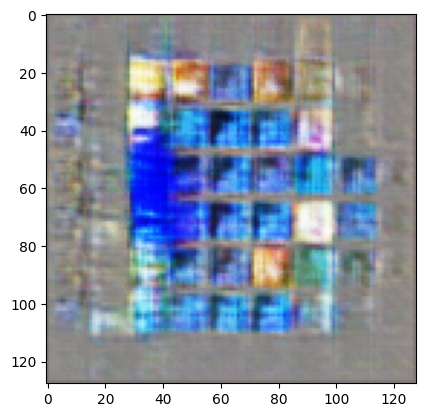

Saved!
At epoch 27, the duration was 13.10 minutes!
Discriminator Loss: -0.6578, Generator loss: 0.3124


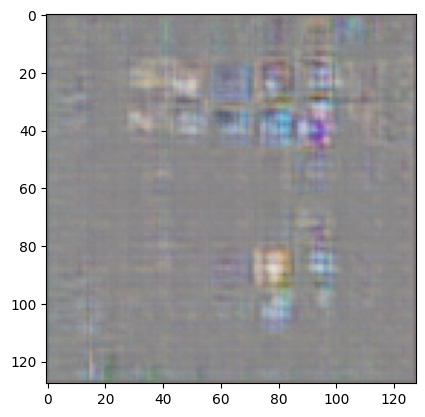

Saved!
At epoch 28, the duration was 13.12 minutes!
Discriminator Loss: -0.6588, Generator loss: 0.3131


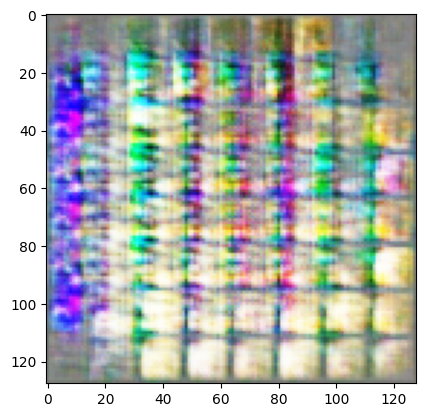

Saved!
At epoch 29, the duration was 13.09 minutes!
Discriminator Loss: -0.6586, Generator loss: 0.3130


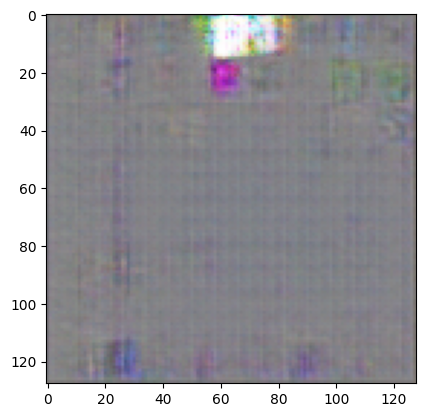

Saved!
At epoch 30, the duration was 13.08 minutes!
Discriminator Loss: -0.6588, Generator loss: 0.3131


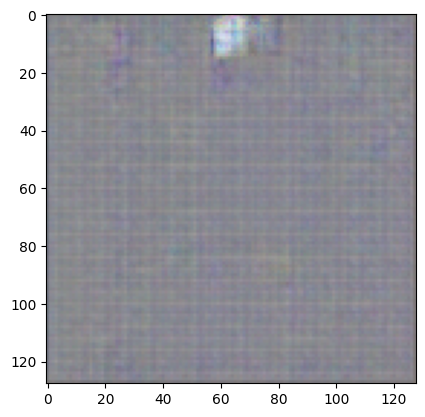

Saved!
At epoch 31, the duration was 13.08 minutes!
Discriminator Loss: -0.6575, Generator loss: 0.3122


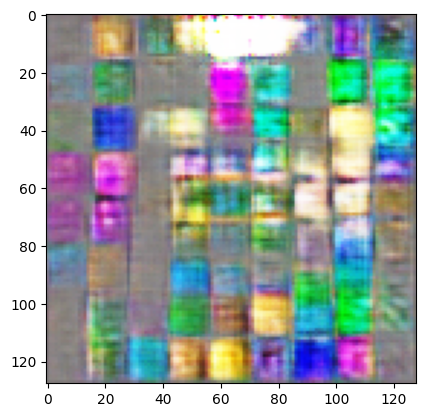

Saved!
At epoch 32, the duration was 13.07 minutes!
Discriminator Loss: -0.6588, Generator loss: 0.3131


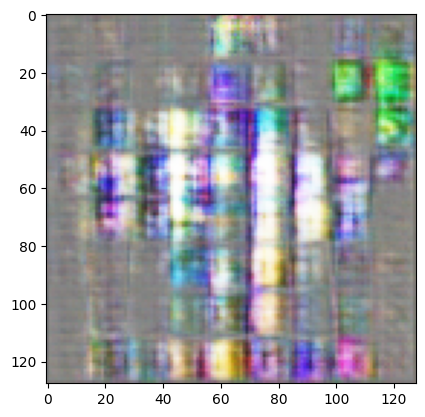

Saved!
At epoch 33, the duration was 13.07 minutes!
Discriminator Loss: -0.6588, Generator loss: 0.3131


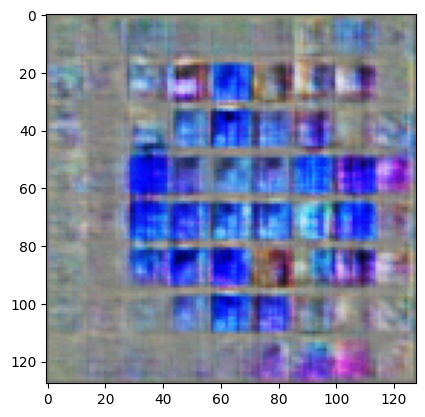

Saved!
At epoch 34, the duration was 13.12 minutes!
Discriminator Loss: -0.6572, Generator loss: 0.3128


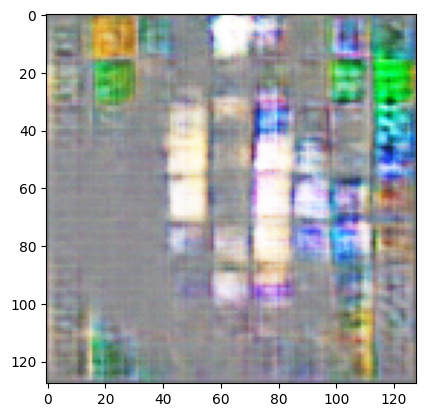

Saved!
At epoch 35, the duration was 13.13 minutes!
Discriminator Loss: -0.6587, Generator loss: 0.3131


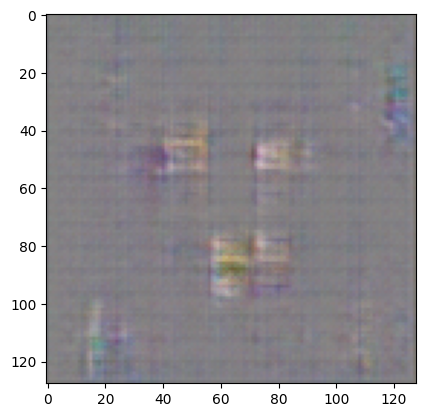

Saved!
At epoch 36, the duration was 13.13 minutes!
Discriminator Loss: -0.6585, Generator loss: 0.3130


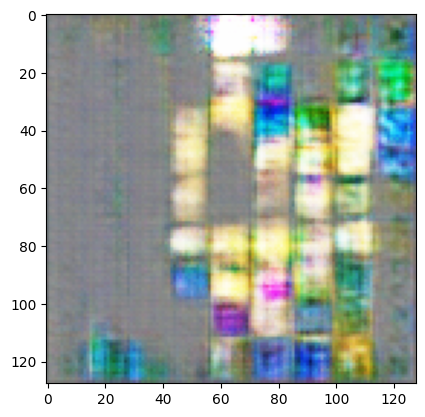

Saved!
At epoch 37, the duration was 13.10 minutes!
Discriminator Loss: -0.6587, Generator loss: 0.3130


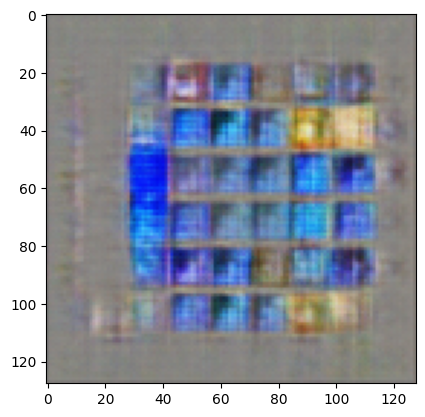

Saved!
At epoch 38, the duration was 13.15 minutes!
Discriminator Loss: -0.6573, Generator loss: 0.3123


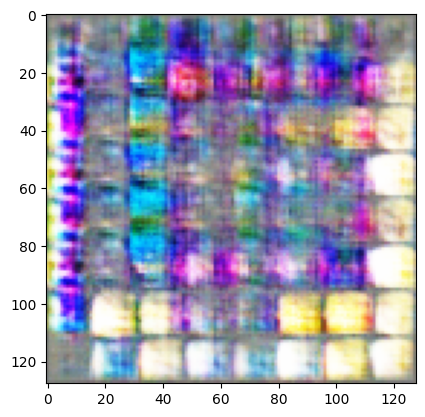

Saved!
At epoch 39, the duration was 13.13 minutes!
Discriminator Loss: -0.6580, Generator loss: 0.3089


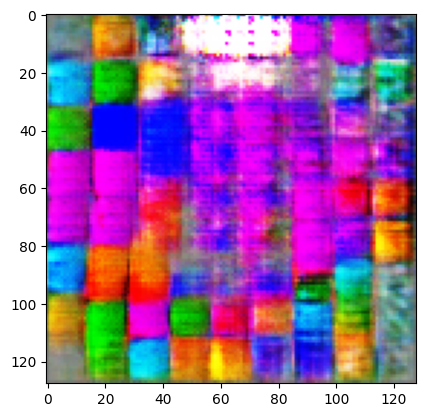

Saved!
At epoch 40, the duration was 13.15 minutes!
Discriminator Loss: -0.0057, Generator loss: -0.3359


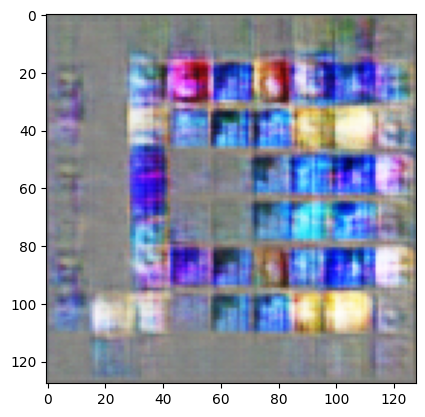

Saved!


KeyboardInterrupt: 

In [16]:
disc_optim = optim.RMSprop(disc.parameters(), lr = lr)
gen_optim = optim.RMSprop(gen.parameters(), lr = lr)

gen.train()
disc.train()
WEIGHT_CLIP_LOWER = -0.0075
WEIGHT_CLIP_UPPER = 0.0075
generated_images = []
epochs = 2201

#for _ in range(2):
for epoch in range(epochs):
    epoch_start_time = time.time()
    for _ in range(80):
        for batch_idx, real_img in enumerate(train_loader): 
            real_img = real_img.to(device)
            for _ in range(3):
                noise = torch.randn(batch_size, latent_dim, 1, 1) #+ torch.randn(batch_size, latent_dim, 1, 1) * 0.01
                noise = noise.to(device)
                gen_img = gen(noise)
                disc_real_img = disc(real_img).view(-1)
                disc_gen_img = disc(gen_img).view(-1)
                loss_disc = -(torch.mean(disc_real_img) - torch.mean(disc_gen_img))
                disc.zero_grad() # empty gradients 
                loss_disc.backward(retain_graph = True) # backpropagate 
                disc_optim.step() # update parameters 

                # clip critic weights 
                for p in disc.parameters():
                    p.data.clamp_(WEIGHT_CLIP_LOWER, WEIGHT_CLIP_UPPER)

            # Train generator
            output = disc(gen_img).view(-1)
            loss_gen = -torch.mean(output)
            gen.zero_grad()
            loss_gen.backward()
            gen_optim.step()
      

    with torch.no_grad():
        generated = (gen(noise)).reshape([*img.shape]).to(device)
        generated = (generated * torch.tensor(stds).view(3, 1, 1)) + torch.tensor(means).view(3, 1, 1).to(device)
        #generated = generated * 255.0
        generated_images.append(generated)
        real = real_img.reshape([*img.shape])
        

    print(f"At epoch {epoch}, the duration was {((time.time() - epoch_start_time)/60):.2f} minutes!")
    print(f"Discriminator Loss: {loss_disc:.4f}, Generator loss: {loss_gen:.4f}")
  
    x = generated_images[-1][0].detach().cpu().numpy() 
    x = np.transpose(x, (2, 1, 0))
    plt.imshow(x)
    plt.show()
  
    generator_states = gen.state_dict()
    discriminator_states = disc.state_dict()
    torch.save(generator_states, "/home/jovyan/generator_2.pth")
    torch.save(discriminator_states,"/home/jovyan/discriminator_2.pth")
    print("Saved!")
